In [1]:
import os
os.environ['MUJOCO_GL'] = 'egl'
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
# os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = "0.8" # 0.9 causes too much lag. 
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false" # allow dynamic memory growth
os.environ['JAX_LOG_COMPILES'] = '0' # disable compile logging

import time

import functools

from jax import config

# ===== JAX config =====
config.update("jax_debug_nans", False) # only for debugging
config.update("jax_enable_x64", True)
config.update("jax_default_matmul_precision", "high")

cache_path = "/data/jit_cache"
if not os.path.exists(cache_path):
    os.makedirs(cache_path)
    print(f"Created JAX compilation cache directory at {cache_path}")
config.update("jax_compilation_cache_dir", cache_path)
config.update("jax_persistent_cache_min_entry_size_bytes", -1)
config.update("jax_persistent_cache_min_compile_time_secs", 1)
# =================================

import jax
import jax.numpy as jp
import numpy as np

print("jax.devices():", jax.devices())
print("local_device_count:", jax.local_device_count())

from absl import logging
logging.set_verbosity(logging.DEBUG)

from mujoco_playground import registry
from mujoco_playground import wrapper
from mujoco_playground.config import locomotion_params

# from brax.training.agents.apg import train as apg
# from brax.training.agents.apg import networks as apg_networks

# Using local modified APG version
from apg_alg.algorithm import apg   
from apg_alg.networks import apg_networks

from brax.training.agents.ppo import networks as ppo_networks
from brax.training.agents.ppo import train as ppo

from brax.envs.wrappers import training as brax_training

from brax.training import acting

from brax.io import model

from brax import envs

import matplotlib.pyplot as plt
from IPython.display import HTML, clear_output
from datetime import datetime
import mediapy as media

import wandb

env_name = "Go2Trot"
env_cfg = registry.get_default_config(env_name)
randomizer = registry.get_domain_randomizer(env_name)

jax.devices(): [CudaDevice(id=0)]
local_device_count: 1
Warp DeprecationWarning: The namespace `warp.context` will soon be removed from the public API. It can still be accessed from `warp._src.context` but might be changed or removed without notice.
Warp DeprecationWarning: The symbol `warp.context.Module` will soon be removed from the public API. Use `warp.Module` instead.
Warp DeprecationWarning: The symbol `warp.context.get_module` will soon be removed from the public API. Use `warp.get_module` instead.
Warp DeprecationWarning: The namespace `warp.math` will soon be removed from the public API. It can still be accessed from `warp._src.math` but might be changed or removed without notice.


DEBUG:absl:Created `ArrayHandler` with primary_host=0, replica_id=0, use_replica_parallel=True, array_metadata_store=<orbax.checkpoint._src.metadata.array_metadata_store.Store object at 0x7f6200532ad0>, dispatcher=None
DEBUG:absl:Handler "orbax.checkpoint._src.handlers.base_pytree_checkpoint_handler.BasePyTreeCheckpointHandler" already exists in the registry with associated type <class 'orbax.checkpoint._src.handlers.base_pytree_checkpoint_handler.BasePyTreeCheckpointHandler'>. Skipping registration.
DEBUG:absl:Handler "orbax.checkpoint._src.handlers.array_checkpoint_handler.ArrayCheckpointHandler" already exists in the registry with associated type <class 'orbax.checkpoint._src.handlers.array_checkpoint_handler.ArrayCheckpointHandler'>. Skipping registration.
DEBUG:absl:Handler "orbax.checkpoint._src.handlers.json_checkpoint_handler.JsonCheckpointHandler" already exists in the registry with associated type <class 'orbax.checkpoint._src.handlers.json_checkpoint_handler.JsonCheckpointHa

In [2]:
env_cfg

Kd: 0.5
Kp: 35.0
ctrl_dt: 0.02
env:
  action_scale:
  - 0.2
  - 0.8
  - 0.8
  - 0.2
  - 0.8
  - 0.8
  - 0.2
  - 0.8
  - 0.8
  - 0.2
  - 0.8
  - 0.8
  err_threshold: 0.1
  impratio: 100
  iterations: 1
  reference_state_init: false
  reset2ref: true
  step_k: 13
  termination_height: 0.1
episode_length: 240
impl: jax
nconmax: 32768
njmax: 40
pert_config:
  enable: false
  kick_durations:
  - 0.05
  - 0.2
  kick_wait_times:
  - 1.0
  - 3.0
  velocity_kick:
  - 0.0
  - 3.0
rewards:
  scales:
    base_tracking: -1.0
    feet_height: -10.0
    min_reference_tracking: -0.0075
    reference_tracking: -10.0
sim_dt: 0.002

In [3]:
def render_rollout(
    reset_fn, 
    step_fn, 
    env, 
    batch_size, 
    inference_fn, 
    n_step, 
    render_every, 
    seed=0, 
    save_path=None
):
    """
    Rollout and render using the environment's internal optimized renderer.
    
    Args:
        reset_fn: JIT-compiled reset function.
        step_fn: JIT-compiled step function.
        env: The environment instance (must have _render_trajectory method).
        batch_size: Number of parallel environments (only index 0 is rendered).
        inference_fn: Function (obs, rng) -> (action, extra).
        n_step: Max steps per episode.
        render_every: Downsampling factor for rendering.
        seed: Random seed.
        save_path: Optional path to save .mp4 video.
    """
    print("Starting rollout for rendering...")
    
    # 1. Initialize RNG and Environment
    rng = jax.random.PRNGKey(seed)
    rngs = jax.random.split(rng, batch_size)
    
    state = reset_fn(rngs)
    
    # 优化点 1: 初始化列表，只收集用于可视化的 qpos (Environment 0)
    # state.data.qpos 的形状通常是 (Batch, Joints)
    # 我们取 [0] 得到 (Joints,)
    trajectory_qpos = [state.data.qpos[0]] 
    
    rewards = 0.0
    
    # 2. Simulation Loop
    for i in range(n_step):
        act_rng, rng = jax.random.split(rng)
        
        # Inference
        action, _ = inference_fn(state.obs, act_rng)
        
        # Physics Step
        state = step_fn(state, action)

        # Early termination check (checking env 0)
        if state.done[0]: 
            print(f"Early termination at step {i+1}")
            break
            
        # 优化点 2: 仅追加第 0 个环境的数据，极大地节省内存
        trajectory_qpos.append(state.data.qpos[0])
        rewards += state.reward
        
    print(f"Total reward (env 0): {float(rewards[0]):.1f}")

    # 3. Data Preparation
    # 将列表堆叠为 JAX Array: (Time, Joints)
    trajectory_stack = jp.stack(trajectory_qpos)
    
    # 4. Optimized Rendering
    # 调用 Env 类中的 _render_trajectory 方法
    # 注意：此时 trajectory_stack 已经是 (T, J) 格式，符合我们改写后的 _render_trajectory 要求
    frames = env._render_trajectory(
        trajectory=trajectory_stack,
        render_every=render_every,
        height=480, 
        width=640,
        save_path=save_path
    )

    # 5. Display in Notebook
    # 计算实际播放帧率：如果模拟步长是 0.02s，每 2 帧渲染一次，则 FPS = 1 / (0.04) = 25
    fps = 1.0 / (env.dt * render_every)
    media.show_video(frames, fps=fps, loop=True)

    # 返回最后的状态，以备后续分析（可选）
    return state

## training APG

In [4]:
apg_env_cfg = registry.get_default_config(env_name)
apg_env_cfg['env']['reset2ref'] = False
apg_env_cfg['env']['reference_state_init'] = True
apg_env_cfg['pert_config']['enable'] = False
apg_env_cfg['pert_config']['velocity_kick'] = [0.0, 3.0]
apg_env_cfg['env']['impratio'] = 100

apg_env_cfg['rewards']['scales']['base_tracking']= -2.0

env = registry.load(env_name, apg_env_cfg)
eval_env = registry.load(env_name, apg_env_cfg)

In [5]:
print(env._mj_model.opt.impratio)
print(eval_env._mj_model.opt.impratio)

100.0
100.0


In [6]:
frames = env.play_ref_motion(render_every=1)

Playing reference motion (Optimized)...


In [6]:
apg_params = locomotion_params.brax_apg_config(env_name)
print(apg_params)

action_repeat: 1
episode_length: 240
horizon_length: 32
learning_rate: 0.0001
max_gradient_norm: 1000000000.0
network_factory:
  hidden_layer_sizes: !!python/tuple
  - 256
  - 128
  policy_obs_key: state
normalize_observations: true
num_envs: 64
num_eval_envs: 64
num_evals: 11
policy_updates: 499
use_float64: true



In [8]:
apg_params["policy_updates"] = 1000
# apg_params["num_envs"] = 512
apg_params["deterministic_eval"] = False
apg_params["num_envs"] = 64
apg_params["num_eval_envs"] = 64
apg_params["horizon_length"] = 32

apg_params["normalize_observations"] = True

print(apg_params)

action_repeat: 1
deterministic_eval: false
episode_length: 240
horizon_length: 32
learning_rate: 0.0001
max_gradient_norm: 1000000000.0
network_factory:
  hidden_layer_sizes: !!python/tuple
  - 256
  - 128
  policy_obs_key: state
normalize_observations: true
num_envs: 64
num_eval_envs: 64
num_evals: 11
policy_updates: 1000
use_float64: true



In [9]:
apg_training_params = dict(apg_params)
network_factory = apg_networks.make_apg_networks
if "network_factory" in apg_params:
    del apg_training_params["network_factory"]
    network_factory = functools.partial(
        apg_networks.make_apg_networks, 
        **apg_params.network_factory)

train_fn = functools.partial(
    apg.train, **dict(apg_training_params),
    network_factory=network_factory,
    randomization_fn=randomizer
    )

wandb.init(project="mujoco-playground-apg-go2", name=f"apg_{datetime.now().strftime('%Y%m%d_%H%M%S')}")

wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /root/.netrc.
wandb: Currently logged in as: mayuxuan2004 (mayuxuan2004-shanghaitech-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


INFO:absl:Device count: 1, process count: 1 (id 0), local device count: 1, devices to be used count: 1
INFO:absl:{'eval/walltime': 83.59343552589417, 'eval/episode_base_tracking': Array(-110.50055074, dtype=float64), 'eval/episode_feet_height': Array(-247.19187993, dtype=float64), 'eval/episode_min_reference_tracking': Array(-13.12610298, dtype=float64), 'eval/episode_reference_tracking': Array(-79.98491889, dtype=float64), 'eval/episode_reward': Array(-450.80345254, dtype=float64), 'eval/episode_base_tracking_std': Array(30.76814166, dtype=float64), 'eval/episode_feet_height_std': Array(51.8174155, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(3.71770267, dtype=float64), 'eval/episode_reference_tracking_std': Array(32.22590444, dtype=float64), 'eval/episode_reward_std': Array(90.90416958, dtype=float64), 'eval/avg_episode_length': Array(210.140625, dtype=float64), 'eval/std_episode_length': Array(62.7723733, dtype=float64), 'eval/epoch_eval_time': 83.59343552589417,

eval/avg_episode_length,▁██████████
eval/episode_base_tracking,▁█▃▄▄▅▅▅▅▅▅
eval/episode_base_tracking_std,█▁▆▅▅▄▅▄▄▅▄
eval/episode_feet_height,▂▁▆████████
eval/episode_feet_height_std,█▁▄▂▂▂▂▂▂▂▂
eval/episode_min_reference_tracking,▂▁▂▅▆▇▇████
eval/episode_min_reference_tracking_std,█▁▁▁▁▁▁▁▁▂▁
eval/episode_reference_tracking,▁█▅▅▆▇▆▇▇▆█
eval/episode_reference_tracking_std,█▁▆▅▅▄▆▃▃▅▃
eval/episode_reward,▁▄▅▇▇█▇██▇█
+13,...


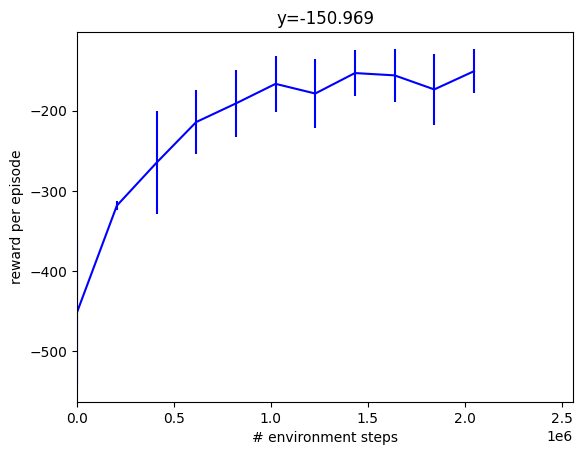

time to jit: 0:02:33.506329
time to train: 0:25:13.038646


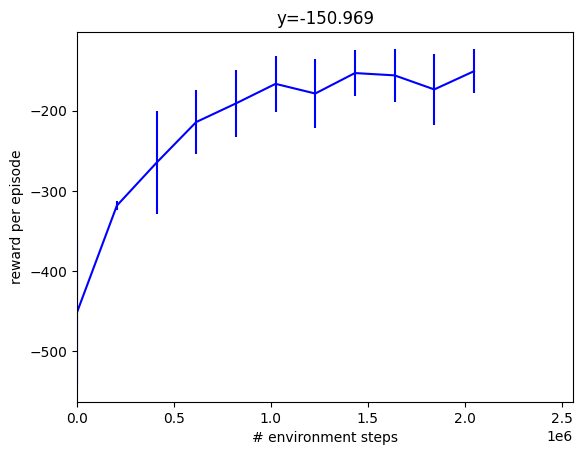

In [10]:
from datetime import datetime
x_data_apg = []
y_data_apg = []
ydataerr_apg = []
times_apg = [datetime.now()]

num_timesteps = apg_params["policy_updates"] * apg_params["horizon_length"] * apg_params["num_envs"] * apg_params["action_repeat"]
updates_per_epoch = round(apg_params["policy_updates"] / max(apg_params["num_evals"] - 1, 1))
scale_it = updates_per_epoch * apg_params["horizon_length"] * apg_params["num_envs"] * apg_params["action_repeat"]

def progress_apg(num_steps, metrics):

    times_apg.append(datetime.now())
    x_data_apg.append(num_steps * scale_it)
    y_data_apg.append(metrics["eval/episode_reward"])
    ydataerr_apg.append(metrics["eval/episode_reward_std"])
    wandb.log(metrics,step=num_steps * scale_it)

make_inference_fn, params, metrics = train_fn(
    environment=env,
    eval_env=eval_env,
    wrap_env_fn=wrapper.wrap_for_brax_training,
    progress_fn=progress_apg
)

wandb.finish()

plt.xlim([0, num_timesteps * 1.25])
plt.xlabel("# environment steps")
plt.ylabel("reward per episode")
plt.title(f"y={y_data_apg[-1]:.3f}")
plt.errorbar(x_data_apg, y_data_apg, yerr=ydataerr_apg, color="blue")
display(plt.gcf())

print(f"time to jit: {times_apg[1] - times_apg[0]}")
print(f"time to train: {times_apg[-1] - times_apg[1]}")

In [11]:
demo_cfg = registry.get_default_config(env_name)
demo_cfg['env']['reset2ref'] = False
demo_cfg['env']['reference_state_init'] = False
demo_cfg['pert_config']['enable'] = False
demo_cfg['pert_config']['velocity_kick'] = [0.0, 3.0]
demo_cfg['env']['impratio'] = 100
demo_env = registry.load(env_name, demo_cfg)
demo_env = brax_training.VmapWrapper(demo_env)
demo_step_fn = jax.jit(demo_env.step)
demo_reset_fn = jax.jit(demo_env.reset)
jit_inference_fn = jax.jit(make_inference_fn(params, deterministic=True))

final_state = render_rollout(
    demo_reset_fn, demo_step_fn, demo_env, 1,
    jit_inference_fn, n_step=1002, render_every=3, seed=42)

Starting rollout for rendering...
Total reward (env 0): -354.2


In [12]:
from brax.io import model
from etils import epath
now = datetime.now()
timestamp = now.strftime("%Y%m%d-%H%M%S")
exp_name =  f"{env_name}-{timestamp}"
ckpt_path = epath.Path("checkpoints").resolve() / exp_name
ckpt_path.mkdir(parents=True, exist_ok=True)
print(f"Checkpoint path: {ckpt_path}")
model_path = ckpt_path / "trotting_apg_2hz_policy.pkl"
print(f"Saving model to: {model_path}")
# model_path = 'check_points/trotting_apg_2hz_policy'
model.save_params(model_path, params)

Checkpoint path: /data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2Trot-20260131-114305
Saving model to: /data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2Trot-20260131-114305/trotting_apg_2hz_policy.pkl


load and play

In [13]:
demo_cfg = registry.get_default_config(env_name)
demo_cfg['env']['reset2ref'] = False
demo_cfg['env']['reference_state_init'] = False
demo_cfg['pert_config']['enable'] = False
demo_cfg['env']['impratio'] = 100
demo_env = registry.load(env_name, demo_cfg)
demo_env = brax_training.VmapWrapper(demo_env)
demo_step_fn = jax.jit(demo_env.step)
demo_reset_fn = jax.jit(demo_env.reset)

full_params = model.load_params('/data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2Trot-20260131-114305/trotting_apg_2hz_policy.pkl') # (norm_params, policy_params)

# 2. 使用标准的 running_statistics.normalize
# 这个函数需要接收 params 作为参数，正如训练时那样
from brax.training.acme import running_statistics
normalize = running_statistics.normalize

# 3. 创建网络
# 这里的 normalize 是一个通用的函数，不包含具体数值
apg_params = locomotion_params.brax_apg_config(env_name)
apg_training_params = dict(apg_params)
network_factory = apg_networks.make_apg_networks
if "network_factory" in apg_params:
    del apg_training_params["network_factory"]
    network_factory = functools.partial(
        apg_networks.make_apg_networks, 
        **apg_params.network_factory)
    
apg_network = network_factory(
    demo_env.observation_size, 
    demo_env.action_size, 
    preprocess_observations_fn=normalize
)

make_inference_fn = apg_networks.make_inference_fn(apg_network)

# --- 关键修改 ---
# 直接传入完整的 full_params
# apply(*full_params) -> apply(norm_params, policy_params, obs) -> 完美匹配
jit_inference_fn = jax.jit(make_inference_fn(full_params, deterministic=True))

# 4. 运行
final_state = render_rollout(
    demo_reset_fn, demo_step_fn, demo_env, 1,
    jit_inference_fn, n_step=1002, render_every=3, seed=42
)

Starting rollout for rendering...
Total reward (env 0): -383.5


onnx

In [31]:
"""
Export trained APG Go2 policy to ONNX format (jax2onnx>=0.10.0)
"""

import jax.numpy as jnp
# from jax2onnx import to_onnx 
import torch
# import onnx 
from brax.io import model
from brax.training.acme import running_statistics
from mujoco_playground._src.locomotion.go2 import go2_constants as consts


# --------------------------------------------------
# 1. Load environment and config
# --------------------------------------------------
env_name = "Go2Trot"
demo_cfg = registry.get_default_config(env_name)
demo_cfg['env']['reset2ref'] = False
demo_cfg['env']['reference_state_init'] = False
demo_cfg['pert_config']['enable'] = True

demo_env = registry.load(env_name, demo_cfg)
demo_env = brax_training.VmapWrapper(demo_env)

# --------------------------------------------------
# 2. Build network and load trained params
# --------------------------------------------------
apg_params = locomotion_params.brax_apg_config(env_name)
params = model.load_params('/data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2Trot-20260130-124613/trotting_apg_2hz_policy.pkl')  # 训练结果

network_factory = apg_networks.make_apg_networks
apg_training_params = dict(apg_params)

if "network_factory" in apg_params:
    del apg_training_params["network_factory"]
    network_factory = functools.partial(
        apg_networks.make_apg_networks,
        **apg_params.network_factory,
    )

normalize = lambda x, y: x
if apg_params['normalize_observations']:
    normalize = running_statistics.normalize

apg_network = network_factory(
    demo_env.observation_size,
    demo_env.action_size,
    preprocess_observations_fn=normalize,
)



make_inference_fn = apg_networks.make_inference_fn(apg_network)
inference_fn = make_inference_fn(params, deterministic=True)

from typing import Sequence, Dict, Any
def print_jax_params_structure(params: Dict[str, Any], prefix: str = ""):
    """
    递归地打印 JAX/Flax 参数字典的结构和数组的形状。
    这对于检查网络结构和权重迁移非常有用。
    """
    for key, value in params.items():
        current_key = f"{prefix}/{key}" if prefix else key
        if isinstance(value, dict):
            # 如果是嵌套字典，继续递归
            print_jax_params_structure(value, prefix=current_key)
        elif isinstance(value, (np.ndarray, jnp.ndarray, torch.Tensor)):
            # 如果是数组，打印其形状
            print(f"Key: {current_key}, Shape: {value.shape}, Type: {type(value).__name__}")
        else:
            # 打印非数组叶节点的值
            print(f"Key: {current_key}, Value: {value}, Type: {type(value).__name__}")

print("input dim: ", demo_env.observation_size)
print("output dim: ", demo_env.action_size)
print("network structure: ", network_factory.keywords)
params = (params[0], params[1])
print("shape of mean: ", params[0].mean['state'].shape, 
      "\nshape of std: ", params[0].std['state'].shape)
print()
print_jax_params_structure(params[1])

input dim:  {'state': (40,)}
output dim:  12
network structure:  {'hidden_layer_sizes': (256, 128), 'policy_obs_key': 'state'}
shape of mean:  (40,) 
shape of std:  (40,)

Key: params/LayerNorm_0/bias, Shape: (256,), Type: ArrayImpl
Key: params/LayerNorm_0/scale, Shape: (256,), Type: ArrayImpl
Key: params/LayerNorm_1/bias, Shape: (128,), Type: ArrayImpl
Key: params/LayerNorm_1/scale, Shape: (128,), Type: ArrayImpl
Key: params/hidden_0/bias, Shape: (256,), Type: ArrayImpl
Key: params/hidden_0/kernel, Shape: (40, 256), Type: ArrayImpl
Key: params/hidden_1/bias, Shape: (128,), Type: ArrayImpl
Key: params/hidden_1/kernel, Shape: (256, 128), Type: ArrayImpl
Key: params/hidden_2/bias, Shape: (24,), Type: ArrayImpl
Key: params/hidden_2/kernel, Shape: (128, 24), Type: ArrayImpl


## training PPO

In [ ]:
ppo_env_cfg = registry.get_default_config(env_name)
ppo_env_cfg['env']['reset2ref'] = True
ppo_env_cfg['env']['reference_state_init'] = True
ppo_env_cfg['pert_config']['enable'] = False
ppo_env_cfg['pert_config']['velocity_kick'] = [0.0, 3.0]
env = registry.load(env_name, ppo_env_cfg)
eval_env = registry.load(env_name, ppo_env_cfg)

In [ ]:
ppo_params = locomotion_params.brax_ppo_config(env_name)
print(ppo_params)

action_repeat: 1
batch_size: 1024
discounting: 0.97
entropy_cost: 0.001
episode_length: 240
learning_rate: 0.0003
max_grad_norm: 1.0
network_factory:
  policy_hidden_layer_sizes: !!python/tuple
  - 256
  - 128
  policy_obs_key: state
  value_hidden_layer_sizes: !!python/tuple
  - 512
  - 256
  - 128
  value_obs_key: state
normalize_observations: true
num_envs: 1024
num_evals: 10
num_minibatches: 32
num_resets_per_eval: 10
num_timesteps: 10000000
num_updates_per_batch: 8
reward_scaling: 0.1
unroll_length: 32



In [ ]:
wandb.init(project="mujoco-playground-ppo-go2", name=f"ppo_{datetime.now().strftime('%Y%m%d_%H%M%S')}")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


In [ ]:
# ppo_params["num_envs"] = 512
ppo_params["num_timesteps"] = 1_000_000
ppo_params["episode_length"] = 240
print(ppo_params)
# ppo_params = locomotion_params.brax_ppo_config("AnymalTrot")
ppo_training_params = dict(ppo_params)
ppo_network_factory = ppo_networks.make_ppo_networks
if "network_factory" in ppo_params:
    del ppo_training_params["network_factory"]
    ppo_network_factory = functools.partial(
        ppo_networks.make_ppo_networks,
        **ppo_params.network_factory
    )

x_data_ppo = []
y_data_ppo = []
ydataerr_ppo = []
times_ppo = [datetime.now()]

def progress_ppo(num_steps, metrics):

    times_ppo.append(datetime.now())
    x_data_ppo.append(num_steps)
    y_data_ppo.append(metrics["eval/episode_reward"])
    ydataerr_ppo.append(metrics["eval/episode_reward_std"])
    wandb.log(metrics,step=num_steps)
    print(f"Step {num_steps}")
    print()

train_ppo_fn = functools.partial(
    ppo.train, **dict(ppo_training_params),
    network_factory=ppo_network_factory,
    progress_fn=progress_ppo,
    randomization_fn=randomizer
)

action_repeat: 1
batch_size: 1024
discounting: 0.97
entropy_cost: 0.001
episode_length: 240
learning_rate: 0.0003
max_grad_norm: 1.0
network_factory:
  policy_hidden_layer_sizes: !!python/tuple
  - 256
  - 128
  policy_obs_key: state
  value_hidden_layer_sizes: !!python/tuple
  - 512
  - 256
  - 128
  value_obs_key: state
normalize_observations: true
num_envs: 1024
num_evals: 10
num_minibatches: 32
num_resets_per_eval: 10
num_timesteps: 1000000
num_updates_per_batch: 8
reward_scaling: 0.1
unroll_length: 32



INFO:absl:Device count: 2, process count: 1 (id 0), local device count: 2, devices to be used count: 2
INFO:absl:{'eval/walltime': 57.277504682540894, 'eval/episode_base_tracking': Array(-251.541871, dtype=float64), 'eval/episode_feet_height': Array(-486.54758743, dtype=float64), 'eval/episode_min_reference_tracking': Array(-64.23564081, dtype=float64), 'eval/episode_reference_tracking': Array(-886.07788634, dtype=float64), 'eval/episode_reward': Array(-1688.40298558, dtype=float64), 'eval/episode_base_tracking_std': Array(17.71157053, dtype=float64), 'eval/episode_feet_height_std': Array(21.00357521, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(1.35574968, dtype=float64), 'eval/episode_reference_tracking_std': Array(64.61986586, dtype=float64), 'eval/episode_reward_std': Array(81.8460709, dtype=float64), 'eval/avg_episode_length': Array(240., dtype=float64), 'eval/std_episode_length': Array(0., dtype=float64), 'eval/epoch_eval_time': 57.277504682540894, 'eval/sps':

Step 0



INFO:absl:{'eval/walltime': 117.53264570236206, 'training/sps': np.float64(416249.960767957), 'training/walltime': 370.61901783943176, 'training/entropy_loss': Array(-0.00519406, dtype=float64), 'training/policy_loss': Array(-0.01984949, dtype=float64), 'training/total_loss': Array(0.1027932, dtype=float64), 'training/v_loss': Array(0.12783675, dtype=float64), 'eval/episode_base_tracking': Array(-160.34828511, dtype=float64), 'eval/episode_feet_height': Array(-330.57138301, dtype=float64), 'eval/episode_min_reference_tracking': Array(-55.38210037, dtype=float64), 'eval/episode_reference_tracking': Array(-462.8680156, dtype=float64), 'eval/episode_reward': Array(-1009.1697841, dtype=float64), 'eval/episode_base_tracking_std': Array(10.35672827, dtype=float64), 'eval/episode_feet_height_std': Array(15.2464275, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(1.14493236, dtype=float64), 'eval/episode_reference_tracking_std': Array(31.14756712, dtype=float64), 'eval/episode

Step 10485760



INFO:absl:{'eval/walltime': 119.65800428390503, 'training/sps': np.float64(415742.52162963146), 'training/walltime': 622.7580308914185, 'training/entropy_loss': Array(-0.0028908, dtype=float64), 'training/policy_loss': Array(-0.01734499, dtype=float64), 'training/total_loss': Array(0.03438191, dtype=float64), 'training/v_loss': Array(0.0546177, dtype=float64), 'eval/episode_base_tracking': Array(-123.00815776, dtype=float64), 'eval/episode_feet_height': Array(-246.17506361, dtype=float64), 'eval/episode_min_reference_tracking': Array(-46.65708132, dtype=float64), 'eval/episode_reference_tracking': Array(-288.33014942, dtype=float64), 'eval/episode_reward': Array(-704.17045211, dtype=float64), 'eval/episode_base_tracking_std': Array(8.35536385, dtype=float64), 'eval/episode_feet_height_std': Array(11.63523837, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.95382015, dtype=float64), 'eval/episode_reference_tracking_std': Array(19.16021999, dtype=float64), 'eval/episod

Step 20971520



INFO:absl:{'eval/walltime': 121.78307032585144, 'training/sps': np.float64(415748.8332549267), 'training/walltime': 874.9264359474182, 'training/entropy_loss': Array(-6.7866783e-06, dtype=float64), 'training/policy_loss': Array(-0.01715135, dtype=float64), 'training/total_loss': Array(0.00819372, dtype=float64), 'training/v_loss': Array(0.02535185, dtype=float64), 'eval/episode_base_tracking': Array(-95.99917073, dtype=float64), 'eval/episode_feet_height': Array(-189.83050821, dtype=float64), 'eval/episode_min_reference_tracking': Array(-37.25294082, dtype=float64), 'eval/episode_reference_tracking': Array(-179.01159148, dtype=float64), 'eval/episode_reward': Array(-502.09421124, dtype=float64), 'eval/episode_base_tracking_std': Array(6.24170072, dtype=float64), 'eval/episode_feet_height_std': Array(11.00306652, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.88008564, dtype=float64), 'eval/episode_reference_tracking_std': Array(12.94439669, dtype=float64), 'eval/epi

Step 31457280



INFO:absl:{'eval/walltime': 123.91016411781311, 'training/sps': np.float64(416135.7643337763), 'training/walltime': 1127.046587228775, 'training/entropy_loss': Array(0.00334454, dtype=float64), 'training/policy_loss': Array(-0.01608107, dtype=float64), 'training/total_loss': Array(-0.00040275, dtype=float64), 'training/v_loss': Array(0.01233378, dtype=float64), 'eval/episode_base_tracking': Array(-73.32738778, dtype=float64), 'eval/episode_feet_height': Array(-146.82028616, dtype=float64), 'eval/episode_min_reference_tracking': Array(-27.65803368, dtype=float64), 'eval/episode_reference_tracking': Array(-104.32199985, dtype=float64), 'eval/episode_reward': Array(-352.12770748, dtype=float64), 'eval/episode_base_tracking_std': Array(5.43229634, dtype=float64), 'eval/episode_feet_height_std': Array(10.34758888, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.70494664, dtype=float64), 'eval/episode_reference_tracking_std': Array(8.8826224, dtype=float64), 'eval/episode_

Step 41943040



INFO:absl:{'eval/walltime': 126.03770971298218, 'training/sps': np.float64(415939.59681844566), 'training/walltime': 1379.1977500915527, 'training/entropy_loss': Array(0.00688959, dtype=float64), 'training/policy_loss': Array(-0.01259951, dtype=float64), 'training/total_loss': Array(0.0004682, dtype=float64), 'training/v_loss': Array(0.00617813, dtype=float64), 'eval/episode_base_tracking': Array(-57.73620777, dtype=float64), 'eval/episode_feet_height': Array(-118.99750932, dtype=float64), 'eval/episode_min_reference_tracking': Array(-20.06606883, dtype=float64), 'eval/episode_reference_tracking': Array(-58.81528307, dtype=float64), 'eval/episode_reward': Array(-255.61506899, dtype=float64), 'eval/episode_base_tracking_std': Array(4.57384461, dtype=float64), 'eval/episode_feet_height_std': Array(9.7909483, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.51716652, dtype=float64), 'eval/episode_reference_tracking_std': Array(5.9238801, dtype=float64), 'eval/episode_rew

Step 52428800



INFO:absl:{'eval/walltime': 128.16764044761658, 'training/sps': np.float64(415893.76645137725), 'training/walltime': 1631.3261454105377, 'training/entropy_loss': Array(0.0101507, dtype=float64), 'training/policy_loss': Array(-0.00869272, dtype=float64), 'training/total_loss': Array(0.00485113, dtype=float64), 'training/v_loss': Array(0.00339315, dtype=float64), 'eval/episode_base_tracking': Array(-47.12277519, dtype=float64), 'eval/episode_feet_height': Array(-100.01056304, dtype=float64), 'eval/episode_min_reference_tracking': Array(-15.85661427, dtype=float64), 'eval/episode_reference_tracking': Array(-39.1975566, dtype=float64), 'eval/episode_reward': Array(-202.1875091, dtype=float64), 'eval/episode_base_tracking_std': Array(4.48327066, dtype=float64), 'eval/episode_feet_height_std': Array(10.27284111, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.43109285, dtype=float64), 'eval/episode_reference_tracking_std': Array(5.22845399, dtype=float64), 'eval/episode_re

Step 62914560



INFO:absl:{'eval/walltime': 130.28965282440186, 'training/sps': np.float64(416082.2894122945), 'training/walltime': 1883.4031248092651, 'training/entropy_loss': Array(0.0129701, dtype=float64), 'training/policy_loss': Array(-0.00505195, dtype=float64), 'training/total_loss': Array(0.0102398, dtype=float64), 'training/v_loss': Array(0.00232166, dtype=float64), 'eval/episode_base_tracking': Array(-39.96697809, dtype=float64), 'eval/episode_feet_height': Array(-88.06925734, dtype=float64), 'eval/episode_min_reference_tracking': Array(-13.32442992, dtype=float64), 'eval/episode_reference_tracking': Array(-28.90000887, dtype=float64), 'eval/episode_reward': Array(-170.26067422, dtype=float64), 'eval/episode_base_tracking_std': Array(4.00348617, dtype=float64), 'eval/episode_feet_height_std': Array(10.24734987, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.30531042, dtype=float64), 'eval/episode_reference_tracking_std': Array(3.62615344, dtype=float64), 'eval/episode_rew

Step 73400320



INFO:absl:{'eval/walltime': 132.4137635231018, 'training/sps': np.float64(416377.93362905574), 'training/walltime': 2135.3482451438904, 'training/entropy_loss': Array(0.01536943, dtype=float64), 'training/policy_loss': Array(-0.00226244, dtype=float64), 'training/total_loss': Array(0.01490293, dtype=float64), 'training/v_loss': Array(0.00179594, dtype=float64), 'eval/episode_base_tracking': Array(-34.71976212, dtype=float64), 'eval/episode_feet_height': Array(-79.56460012, dtype=float64), 'eval/episode_min_reference_tracking': Array(-11.88559897, dtype=float64), 'eval/episode_reference_tracking': Array(-23.88929312, dtype=float64), 'eval/episode_reward': Array(-150.05925433, dtype=float64), 'eval/episode_base_tracking_std': Array(4.38890802, dtype=float64), 'eval/episode_feet_height_std': Array(10.80461543, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.27465155, dtype=float64), 'eval/episode_reference_tracking_std': Array(3.85642672, dtype=float64), 'eval/episode_r

Step 83886080



INFO:absl:{'eval/walltime': 134.53490495681763, 'training/sps': np.float64(416555.3475256666), 'training/walltime': 2387.1489362716675, 'training/entropy_loss': Array(0.01727007, dtype=float64), 'training/policy_loss': Array(-1.01435619e-06, dtype=float64), 'training/total_loss': Array(0.01875889, dtype=float64), 'training/v_loss': Array(0.00148983, dtype=float64), 'eval/episode_base_tracking': Array(-31.32222582, dtype=float64), 'eval/episode_feet_height': Array(-75.01652128, dtype=float64), 'eval/episode_min_reference_tracking': Array(-11.04551237, dtype=float64), 'eval/episode_reference_tracking': Array(-20.98322073, dtype=float64), 'eval/episode_reward': Array(-138.3674802, dtype=float64), 'eval/episode_base_tracking_std': Array(3.87975387, dtype=float64), 'eval/episode_feet_height_std': Array(11.51026159, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.24246281, dtype=float64), 'eval/episode_reference_tracking_std': Array(3.36595647, dtype=float64), 'eval/episod

Step 94371840



INFO:absl:total steps: 94371840


eval/avg_episode_length,▁▁▁▁▁▁▁▁▁▁
eval/episode_base_tracking,▁▄▅▆▇▇▇███
eval/episode_base_tracking_std,█▄▃▂▂▁▁▁▁▁
eval/episode_feet_height,▁▄▅▆▇▇████
eval/episode_feet_height_std,█▄▂▂▁▁▁▁▂▂
eval/episode_min_reference_tracking,▁▂▃▅▆▇▇███
eval/episode_min_reference_tracking_std,█▇▅▅▄▃▂▁▁▁
eval/episode_reference_tracking,▁▄▆▇▇█████
eval/episode_reference_tracking_std,█▄▃▂▂▁▁▁▁▁
eval/episode_reward,▁▄▅▆▇▇████
+11,...


time to jit: 0:01:42.664607
time to train: 0:41:08.961681

Final metrics:
 {'eval/walltime': 134.53490495681763, 'training/sps': np.float64(416555.3475256666), 'training/walltime': 2387.1489362716675, 'training/entropy_loss': Array(0.01727007, dtype=float64), 'training/policy_loss': Array(-1.01435619e-06, dtype=float64), 'training/total_loss': Array(0.01875889, dtype=float64), 'training/v_loss': Array(0.00148983, dtype=float64), 'eval/episode_base_tracking': Array(-31.32222582, dtype=float64), 'eval/episode_feet_height': Array(-75.01652128, dtype=float64), 'eval/episode_min_reference_tracking': Array(-11.04551237, dtype=float64), 'eval/episode_reference_tracking': Array(-20.98322073, dtype=float64), 'eval/episode_reward': Array(-138.3674802, dtype=float64), 'eval/episode_base_tracking_std': Array(3.87975387, dtype=float64), 'eval/episode_feet_height_std': Array(11.51026159, dtype=float64), 'eval/episode_min_reference_tracking_std': Array(0.24246281, dtype=float64), 'eval/episode_refere

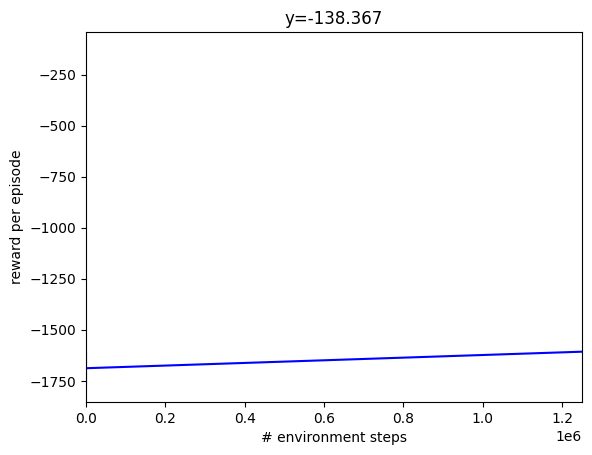

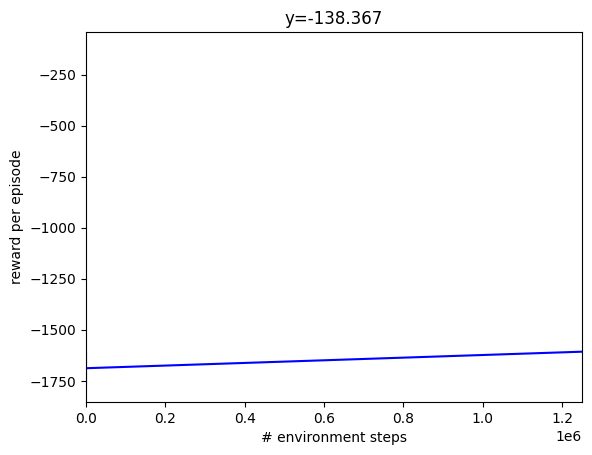

In [ ]:
make_ppo_inference_fn, inference_ppo_params, metrics = train_ppo_fn(
    environment=env,
    eval_env=eval_env,
    wrap_env_fn=wrapper.wrap_for_brax_training,
)

wandb.finish()

print(f"time to jit: {times_ppo[1] - times_ppo[0]}")
print(f"time to train: {times_ppo[-1] - times_ppo[1]}")
print("\nFinal metrics:\n", metrics, "\n")

plt.xlim([0, ppo_params["num_timesteps"] * 1.25])
plt.xlabel("# environment steps")
plt.ylabel("reward per episode")
plt.title(f"y={y_data_ppo[-1]:.3f}")
plt.errorbar(x_data_ppo, y_data_ppo, yerr=ydataerr_ppo, color="blue")
display(plt.gcf())

In [ ]:
demo_cfg = registry.get_default_config(env_name)
demo_cfg['env']['reset2ref'] = False
ppo_env_cfg['env']['reference_state_init'] = False
ppo_env_cfg['pert_config']['enable'] = True
ppo_env_cfg['pert_config']['velocity_kick'] = [0.0, 3.0]
demo_env = registry.load(env_name, demo_cfg)
demo_env = brax_training.VmapWrapper(demo_env)
demo_step_fn = jax.jit(demo_env.step)
demo_reset_fn = jax.jit(demo_env.reset)
jit_inference_ppo_fn = jax.jit(make_ppo_inference_fn(inference_ppo_params, deterministic=True))

frames = render_rollout(
    demo_reset_fn, demo_step_fn, demo_env, 1,
    jit_inference_ppo_fn, n_step=1002, render_every=3, seed=1)

Starting rollout...
Total reward: -5024.9


100%|██████████| 335/335 [00:00<00:00, 341.23it/s]


In [ ]:
from brax.io import model
model_path = '/tmp/trotting_ppo_2hz_policy'
model.save_params(model_path, inference_ppo_params)

load and play

In [ ]:
demo_cfg = registry.get_default_config(env_name)
demo_cfg['env']['reset2ref'] = False
demo_cfg['env']['reference_state_init'] = False
demo_cfg['pert_config']['enable'] = False
demo_env = registry.load(env_name, demo_cfg)
demo_env = brax_training.VmapWrapper(demo_env)
demo_step_fn = jax.jit(demo_env.step)
demo_reset_fn = jax.jit(demo_env.reset)

ppo_params = locomotion_params.brax_ppo_config(env_name)
params = model.load_params('/tmp/trotting_ppo_2hz_policy')
params = (params[0], params[1])
network_factory = ppo_networks.make_ppo_networks
ppo_training_params = dict(ppo_params)
if "network_factory" in ppo_params:
    del ppo_training_params["network_factory"]
    network_factory = functools.partial(
        ppo_networks.make_ppo_networks,
        **ppo_params.network_factory
    )

# from brax.training.acme import running_statistics
normalize = lambda x, y: x
def make_normalize_fn(mean, std, max_abs_value=None):
    def normalize_fn(batch, _unused_processor_params=None):
        def normalize_leaf(data, m, s):
            if not jp.issubdtype(data.dtype, jp.inexact):
                return data
            data = (data - m) / s
            if max_abs_value is not None:
                data = jp.clip(data, -max_abs_value, +max_abs_value)
            return data
        return jax.tree_util.tree_map(normalize_leaf, batch, mean, std)
    return normalize_fn

if ppo_params['normalize_observations']:
    # normalize = running_statistics.normalize
    mean, std = params[0].mean, params[0].std
    normalize = make_normalize_fn(mean, std)
ppo_network = network_factory(
    demo_env.observation_size, demo_env.action_size, preprocess_observations_fn=normalize
)
make_inference_fn = ppo_networks.make_inference_fn(ppo_network)

jit_inference_fn = jax.jit(make_inference_fn(params, deterministic=True))
final_state = render_rollout(
    demo_reset_fn, demo_step_fn, demo_env, 1,
    jit_inference_fn, n_step=1000, render_every=1, seed=42)

Starting rollout...
Total reward: -5041.1


100%|██████████| 1001/1001 [00:02<00:00, 346.37it/s]
